# Python Segmentation API


In [2]:
# must run in an environment where polarityJaM is installed
from polarityjam import Plotter
from polarityjam import RuntimeParameter, PlotParameter, ImageParameter
from polarityjam import PolarityJamLogger
from polarityjam import load_segmenter
from polarityjam import SegmentationMode
from polarityjam import SegmentationParameter
from polarityjam.utils.io import read_image

from pathlib import Path

In [3]:
# Setup a logger to only report WARNINGS, Put "INFO" or "DEBUG" to get more information
plog = PolarityJamLogger("WARNING")

## Setup your data

We expect you to be already familiar with basic usage of polarityjam. Hence we will shorten necessary data preparation steps. Please look at the Python API section of the documentation for more information.

In [4]:
### ADAPT ME ###
path_root = Path("")
input_file = path_root.joinpath("data/golgi_nuclei/set_2/060721_EGM2_18dyn_02.tif")
output_path = path_root.joinpath("polarityjam_out/")
output_file_prefix = "060721_EGM2_18dyn_02"
### ADAPT ME ###

img = read_image(input_file)

# Parameters
params_image = ImageParameter()
params_image.channel_organelle = 0  # golgi channel
params_image.channel_nucleus = 2
params_image.channel_junction = 3
params_image.channel_expression_marker = 3
params_image.pixel_to_micron_ratio = 2.4089

# Parameters
params_runtime = RuntimeParameter()
params_plot = PlotParameter()
params_plot.dpi = 96

# plotter object
plotter = Plotter(params_plot)

## Several segmentation algorithms in parallel
Polarity-JaM currently supports three segmentation algorithms out of the box.

Here, we show how easy it is to switch from one to another and how to compare performance.

<div class="alert alert-info">

Note

The quality of the plots are reduced to limit the size of the notebook. You can adjust the dpi in the `PlotParameter` object to improve the quality of the plots.

</div>

### Step 1 - Prepare your image

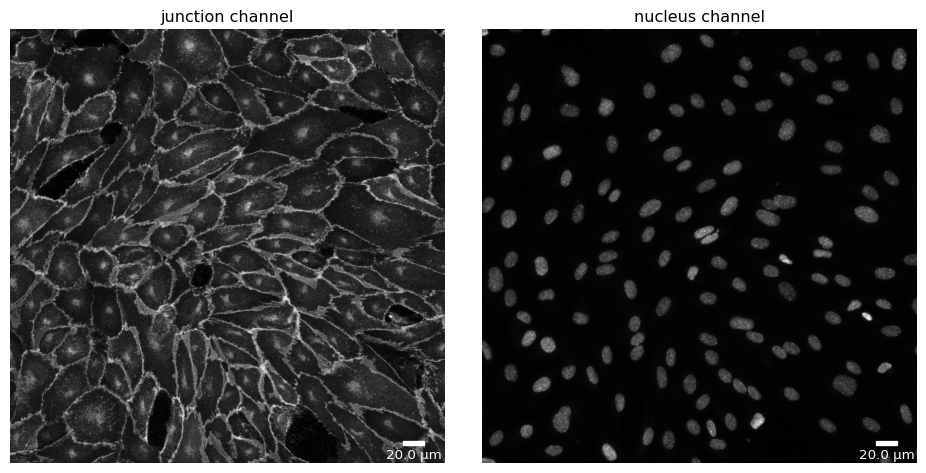

In [5]:
# Cellpose - switch off mask loading (if exists) and saving
cp_seg_p = SegmentationParameter(params_runtime.segmentation_algorithm)
cp_seg_p.use_given_mask = False
cp_seg_p.store_segmentation = False
cp_seg, _ = load_segmenter(params_runtime, cp_seg_p)
cp_seg_prep, cp_seg_prep_p = cp_seg.prepare(img, params_image)
plotter.plot_channels(cp_seg_prep, cp_seg_prep_p, output_path=output_path, filename=input_file);

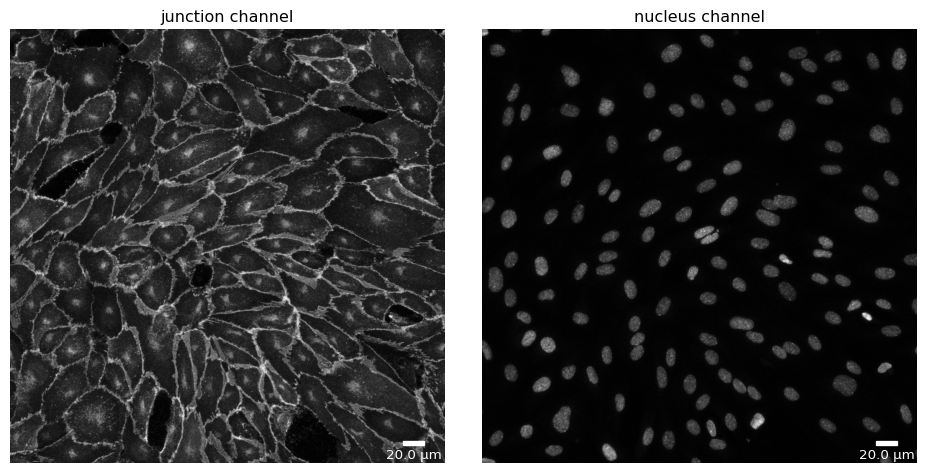

In [6]:
# Deepcell - default parameters
params_runtime.segmentation_algorithm = "DeepCellSegmenter"
dc_seg, _ = load_segmenter(params_runtime)
dc_seg_prep, dc_seg_prep_p = dc_seg.prepare(img, params_image)
plotter.plot_channels(dc_seg_prep, dc_seg_prep_p, output_path, input_file);

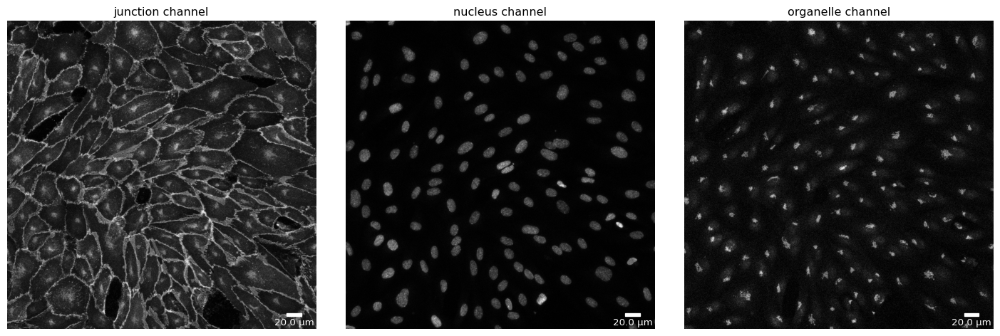

In [7]:
# microSam - default parameters
params_runtime.segmentation_algorithm = "MicrosamSegmenter"
ms_seg, _ = load_segmenter(params_runtime)
ms_seg_prep, ms_seg_prep_p = ms_seg.prepare(img, params_image)
plotter.plot_channels(ms_seg_prep, ms_seg_prep_p, output_path, input_file);

### Step 2 - Segment your image

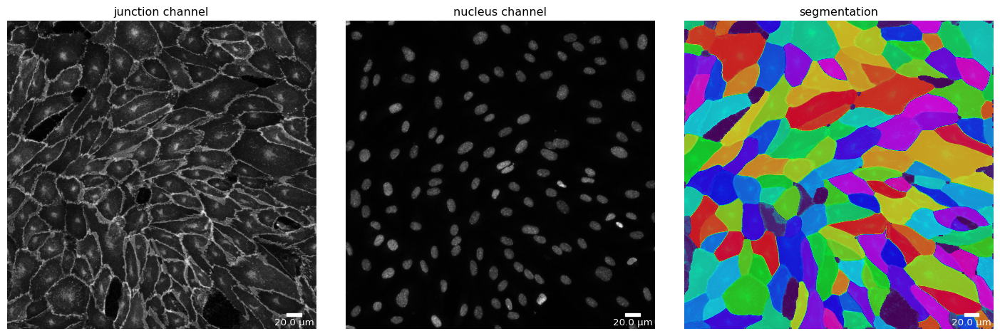

In [8]:
# Cellpose
cp_mask = cp_seg.segment(cp_seg_prep)
plotter.plot_mask(cp_mask, cp_seg_prep, cp_seg_prep_p, output_path, output_file_prefix);

14:05:50 INFO    

Solution credits:

Noah F. Greenwald and Geneva Miller and Erick Moen and Alex Kong and Adam Kagel and Thomas Dougherty and Christine Camacho Fullaway and Brianna J. McIntosh and Ke Xuan Leow and Morgan Sarah Schwartz and Cole Pavelchek and Sunny Cui and Isabella Camplisson and Omer Bar-Tal and Jaiveer Singh and Mara Fong and Gautam Chaudhry and Zion Abraham and Jackson Moseley and Shiri Warshawsky and Erin Soon and Shirley Greenbaum and Tyler Risom and Travis Hollmann and Sean C. Bendall and Leeat Keren and William Graf and Michael Angelo and David Van Valen; Whole-cell segmentation of tissue images with human-level performance using large-scale data annotation and deep learning (DOI: https://doi.org/10.1038/s41587-021-01094-0)


14:05:50 INFO    ~ Starting DeepCell-predict
14:05:51 INFO    ~ 2025-04-16 14:05:51.088340: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cann

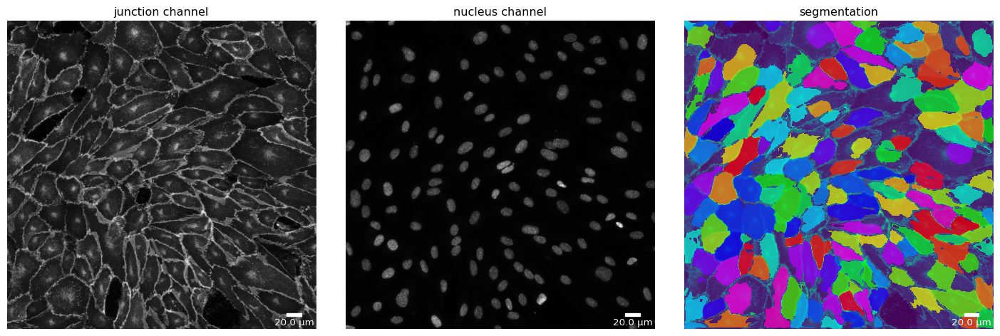

In [9]:
# Deepcell
dc_mask = dc_seg.segment(dc_seg_prep)
plotter.plot_mask(dc_mask, dc_seg_prep, dc_seg_prep_p, output_path, output_file_prefix);

14:06:09 INFO    ~ Starting microSAM-predict
14:06:09 INFO    ~ Set MPLBACKEND from module://matplotlib_inline.backend_inline to qtagg
14:06:15 INFO    ~ /home/jpa/PycharmProjects/polarityjam/src/polarityjam/segmentation/lnk/env/1/lib/python3.10/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_

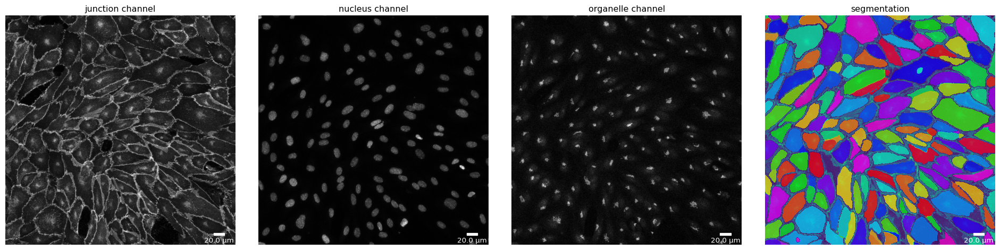

In [10]:
# microSam
ms_mask = ms_seg.segment(ms_seg_prep)
plotter.plot_mask(ms_mask, ms_seg_prep, ms_seg_prep_p, output_path, output_file_prefix);

## Segmentation Mode "Nuclei"

Each segmentation algorithm supported in Polarity-JaM has several modi for different segmentation tasks. For example, Cellpose can segment nuclei and cytoplasm (based on the junction channel).

Here, we show how to switch to the "nucleus" mode for all three segmentation algorithms and compare the results.


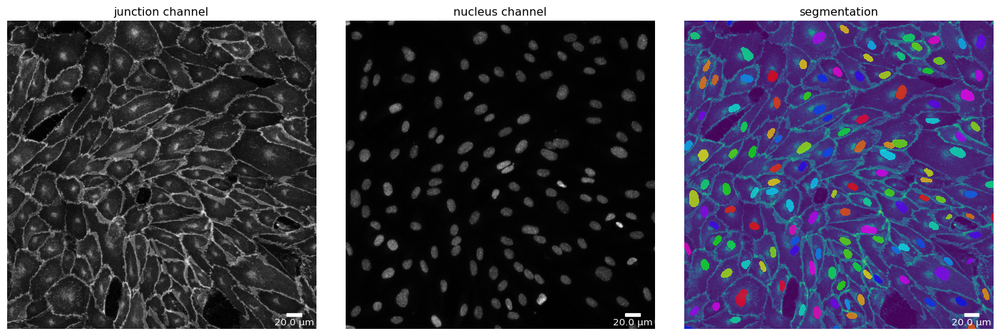

In [11]:
# Cellpose - switch to "nucleus" mode
params_runtime.segmentation_algorithm = "CellposeSegmenter"
cp_seg, _ = load_segmenter(params_runtime, cp_seg_p)

cp_mask_nuc = cp_seg.segment(cp_seg_prep, mode=SegmentationMode.NUCLEUS)
plotter.plot_mask(cp_mask_nuc, cp_seg_prep, cp_seg_prep_p, output_path, output_file_prefix);

14:08:16 INFO    

Solution credits:

Noah F. Greenwald and Geneva Miller and Erick Moen and Alex Kong and Adam Kagel and Thomas Dougherty and Christine Camacho Fullaway and Brianna J. McIntosh and Ke Xuan Leow and Morgan Sarah Schwartz and Cole Pavelchek and Sunny Cui and Isabella Camplisson and Omer Bar-Tal and Jaiveer Singh and Mara Fong and Gautam Chaudhry and Zion Abraham and Jackson Moseley and Shiri Warshawsky and Erin Soon and Shirley Greenbaum and Tyler Risom and Travis Hollmann and Sean C. Bendall and Leeat Keren and William Graf and Michael Angelo and David Van Valen; Whole-cell segmentation of tissue images with human-level performance using large-scale data annotation and deep learning (DOI: https://doi.org/10.1038/s41587-021-01094-0)


14:08:16 INFO    ~ Starting DeepCell-predict
14:08:17 INFO    ~ 2025-04-16 14:08:17.557482: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cann

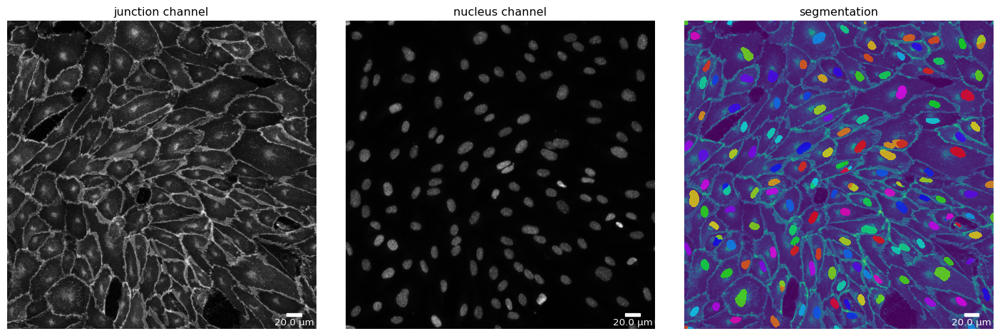

In [12]:
# Deepcell - switch to "nucleus" mode
params_runtime.segmentation_algorithm = "DeepCellSegmenter"
dc_seg, _ = load_segmenter(params_runtime)

dc_mask_nuc = dc_seg.segment(dc_seg_prep, mode=SegmentationMode.NUCLEUS)
plotter.plot_mask(dc_mask_nuc, dc_seg_prep, dc_seg_prep_p, output_path, output_file_prefix);

14:08:56 INFO    ~ Starting microSAM-predict
14:08:56 INFO    ~ Set MPLBACKEND from module://matplotlib_inline.backend_inline to qtagg
14:09:02 INFO    ~ /home/jpa/PycharmProjects/polarityjam/src/polarityjam/segmentation/lnk/env/1/lib/python3.10/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_

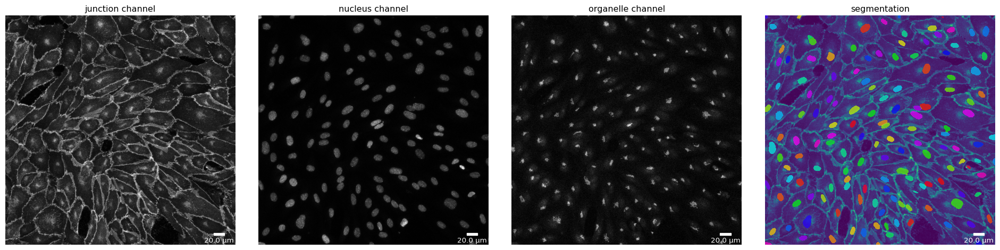

In [13]:
# microSam - switch to "nucleus" mode
params_runtime.segmentation_algorithm = "MicrosamSegmenter"
ms_seg, _ = load_segmenter(params_runtime)

ms_mask_nuc = ms_seg.segment(ms_seg_prep, mode=SegmentationMode.NUCLEUS)
plotter.plot_mask(ms_mask_nuc, ms_seg_prep, ms_seg_prep_p, output_path, output_file_prefix);

## Segmentation Mode "Organelle"

Currently, only microSam supports the "organelle" segmentation mode. As the models focus is not the segmentation of nuclei, results should be taken with a grain of salt. Nevertheless, here we show how to use it.

14:11:01 INFO    ~ Starting microSAM-predict
14:11:01 INFO    ~ Set MPLBACKEND from module://matplotlib_inline.backend_inline to qtagg
14:11:07 INFO    ~ /home/jpa/PycharmProjects/polarityjam/src/polarityjam/segmentation/lnk/env/1/lib/python3.10/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_

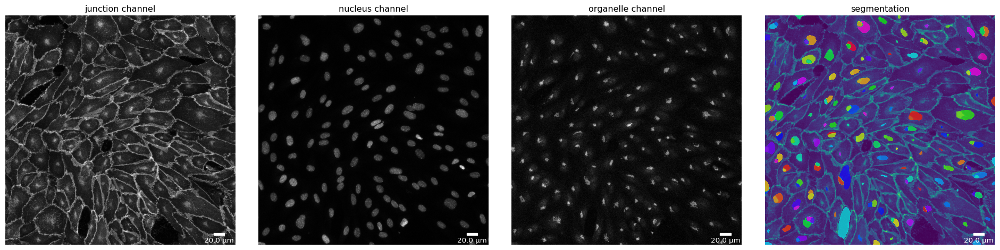

In [14]:
# microSam - switch to "organelle" mode
params_runtime.segmentation_algorithm = "MicrosamSegmenter"

# alter default parameters to enhance segmentation output
ms_seg_p = SegmentationParameter(params_runtime.segmentation_algorithm)
ms_seg_p.pred_iou_thresh = 0.85

# load segmenter with altered parameters
ms_seg, _ = load_segmenter(params_runtime, ms_seg_p)

ms_mask_nuc = ms_seg.segment(ms_seg_prep, mode=SegmentationMode.ORGANELLE)
plotter.plot_mask(ms_mask_nuc, ms_seg_prep, ms_seg_prep_p, output_path, output_file_prefix);